# Imports

In [76]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error
from sklearn.model_selection import GridSearchCV, cross_val_score, train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder, FunctionTransformer
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Import Data

In [77]:
# option to show all columns
pd.set_option('display.max_columns', None)

In [78]:
df = pd.read_csv('train.csv')

In [79]:
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,

In [80]:
# instead of imputting for this variables I will use 0
df['MasVnrArea'] = df['MasVnrArea'].fillna(0)

# Feature Selection

In [81]:
df['MSSubClass'] = df['MSSubClass'].astype('category')
df=df.drop(['Id', 'PoolQC', 'MiscFeature', 'Alley'], axis=1)

In [82]:
# top 25 features from the baseline experiment (RF+GB)
selected_features = [
 'Neighborhood',
 'GarageCars',
 'Fireplaces',
 'GarageArea',
 'YearRemodAdd',
 'BsmtQual',
 'BsmtUnfSF',
 'LotArea',
 'BsmtFinSF1',
 'TotalBsmtSF',
 'ScreenPorch',
 'KitchenQual',
 'OverallQual',
 'WoodDeckSF',
 'MasVnrArea',
 'SaleCondition',
 'OpenPorchSF',
 'LotFrontage',
 'GrLivArea',
 '1stFlrSF',
 'YearBuilt',
 'OverallCond',
 'GarageType',
 'FullBath',
 '2ndFlrSF',
 'TotRmsAbvGrd',
 'GarageYrBlt',
 'ExterQual']

In [83]:
df=df[selected_features + ['SalePrice']]

In [84]:
numerical_features = ['GarageCars', 'Fireplaces', 'GarageArea', 'YearRemodAdd', 'BsmtUnfSF',
       'LotArea', 'BsmtFinSF1', 'TotalBsmtSF', 'ScreenPorch', 'OverallQual',
       'WoodDeckSF', 'MasVnrArea', 'OpenPorchSF', 'LotFrontage', 'GrLivArea',
       '1stFlrSF', 'YearBuilt', 'OverallCond', 'FullBath', '2ndFlrSF',
       'TotRmsAbvGrd', 'GarageYrBlt'
]

categorical_features = ['Neighborhood', 'BsmtQual', 'KitchenQual', 'SaleCondition',
       'GarageType', 'ExterQual'
]

target = 'SalePrice'

In [85]:
df[categorical_features] = df[categorical_features].astype('category')

# Train Test Split

In [86]:
X = df[numerical_features+categorical_features]
y = df[target]

In [87]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)

# Outlier Removal

In [88]:
# for now I won't remove outliers

# Numerical Transformers

In [89]:
numeric_transformer = Pipeline(steps=[
    ('mean_imputer', SimpleImputer(strategy='median')),  # Impute with median
    ('scaler', StandardScaler())  # Scale with StandardScaler
])

# Categorical Transformers

In [90]:
def label_encode(X):
    encoder = LabelEncoder()
    
    X_df = pd.DataFrame(X)
    
    return X_df.apply(lambda col: LabelEncoder().fit_transform(col))

In [91]:
categorical_transformer = Pipeline(steps=[
    ('constant_imputer', SimpleImputer(strategy='constant', fill_value='NA')),  # Impute with NA value instead of leaving null
    ('label_encoder', FunctionTransformer(label_encode, validate=False))  # label encoding due to dimensionality issues
])

# Preprocessing Pipeline

In [92]:
preprocessor = ColumnTransformer(
    transformers=[
        ('num_transformer', numeric_transformer, numerical_features),
        ('cat_transformer', categorical_transformer, categorical_features),
    ])

# Modeling Functions

In [93]:
def show_results(y_test, y_pred):
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = float(np.sqrt(mean_squared_error(y_test, y_pred)))
    mape = mean_absolute_percentage_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    return {'mae': mae, 'mse': mse, 'rmse': rmse, 'mape': mape, 'r2': r2}

In [94]:
def get_output_df(X_test, y_pred, y_test):
    df_compare = X_test.copy()
    
    df_compare['pred'] = y_pred
    df_compare['target'] = y_test.values

    df_compare['absolute_error'] = (df_compare['pred'] - df_compare['target']).abs()
    
    return df_compare

In [95]:
# function to plot the feature importances of tree based algorithms
def show_feature_importances(model, encoding='none'):
    feature_importances = model.named_steps['regressor'].feature_importances_
    
    feature_names = []
    if encoding in ['none', 'one-hot']:
        feature_names = model.named_steps['preprocessor'].get_feature_names_out()
    else:
        # these features must be defined globally in the notebook
        feature_names = numerical_features+categorical_features
    
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': feature_importances
    }).sort_values(by='Importance', ascending=False)
    
    print(importance_df)
    
    # Plotting the horizontal bar chart
    plt.figure(figsize=(10, 8))
    plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.title('Feature Importances')
    plt.gca().invert_yaxis()  # To display the most important feature at the top
    plt.tight_layout()

In [96]:
# Variable that stores the test scores of the different models to decide which one to use
report_ac = {}

# Modeling Parametrizations

In [97]:
metric_to_optimize = 'neg_mean_squared_error'

In [98]:
param_grid_lr = {
    # Linear Regression has no hyperparameters
}

param_grid_ridge = {
    'regressor__alpha': [0.01, 0.1, 1, 10, 100]
}

param_grid_lasso = {
    'regressor__alpha': [0.0001, 0.001, 0.01, 0.1, 1, 10]
}

param_grid_elastic_net = {
    'regressor__alpha': [0.01, 0.1, 1, 10],
    'regressor__l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9]
}

param_grid_svr = {
    'regressor__C': [0.1, 1, 10],
    'regressor__epsilon': [0.01, 0.1, 0.5],
    'regressor__kernel': ['linear', 'rbf']
}

param_grid_knn = {
    'regressor__n_neighbors': [3, 5, 7, 10],
    'regressor__weights': ['uniform', 'distance']
}

param_grid_mlp = {
    'regressor__hidden_layer_sizes': [(50,), (100,), (100, 50)],
    'regressor__activation': ['relu', 'tanh'],
    'regressor__alpha': [0.0001, 0.001, 0.01],
    'regressor__learning_rate': ['constant', 'adaptive']
}

param_grid_rf = {
    'regressor__n_estimators': [100, 200],
    'regressor__max_depth': [5, 10, 20],
    'regressor__min_samples_split': [2, 5]
}

param_grid_gb = {
    'regressor__n_estimators': [100, 200],
    'regressor__learning_rate': [0.05, 0.1, 0.2],
    'regressor__max_depth': [3, 5]
}

# Linear Regression

In [99]:
lr_model = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])

In [100]:
grid_search_lr = GridSearchCV(
    estimator=lr_model,
    param_grid=param_grid_lr,
    cv=5,
    scoring=metric_to_optimize,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [101]:
grid_search_lr.fit(X_train, y_train)

lr_model = grid_search_lr.best_estimator_

y_pred_lr = lr_model.predict(X_test)

Fitting 5 folds for each of 1 candidates, totalling 5 fits


In [102]:
print("Best hyperparameters:", grid_search_lr.best_params_)

results = show_results(y_test, y_pred_lr)
print(results)

report_ac['lr'] = results

Best hyperparameters: {}
{'mae': 22303.948525134034, 'mse': 982812270.2548544, 'rmse': 31349.836845745376, 'mape': 0.13309244366350304, 'r2': 0.8463630084848166}


In [103]:
# get_output_df(X_test, y_pred_lr, y_test)

# Ridge Regression

In [104]:
ridge_model = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('regressor', Ridge())
])

In [105]:
grid_search_ridge = GridSearchCV(
    estimator=ridge_model,
    param_grid=param_grid_ridge,
    cv=5,
    scoring=metric_to_optimize,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [106]:
grid_search_ridge.fit(X_train, y_train)

ridge_model = grid_search_ridge.best_estimator_

y_pred_ridge = ridge_model.predict(X_test)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


In [107]:
print("Best hyperparameters:", grid_search_ridge.best_params_)

results = show_results(y_test, y_pred_ridge)
print(results)

report_ac['ridge'] = results

Best hyperparameters: {'regressor__alpha': 100}
{'mae': 22115.39432987761, 'mse': 975923138.0692586, 'rmse': 31239.768534181854, 'mape': 0.1298929027825543, 'r2': 0.8474399441063782}


# Lasso Regression

In [108]:
lasso_model = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('regressor', Lasso())
])

In [109]:
grid_search_lasso = GridSearchCV(
    estimator=lasso_model,
    param_grid=param_grid_lasso,
    cv=5,
    scoring=metric_to_optimize,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [110]:
grid_search_lasso.fit(X_train, y_train)

lasso_model = grid_search_lasso.best_estimator_

y_pred_lasso = lasso_model.predict(X_test)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


In [111]:
print("Best hyperparameters:", grid_search_lasso.best_params_)

results = show_results(y_test, y_pred_lasso)
print(results)

report_ac['lasso'] = results

Best hyperparameters: {'regressor__alpha': 10}
{'mae': 22297.4005019561, 'mse': 982617464.3698392, 'rmse': 31346.729723686316, 'mape': 0.1330574288336665, 'r2': 0.8463934612894967}


# Elastic Net

In [112]:
elastic_net_model = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('regressor', ElasticNet())
])

In [113]:
grid_search_elastic_net = GridSearchCV(
    estimator=elastic_net_model,
    param_grid=param_grid_elastic_net,
    cv=5,
    scoring=metric_to_optimize,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [114]:
grid_search_elastic_net.fit(X_train, y_train)

elastic_net_model = grid_search_elastic_net.best_estimator_

y_pred_elastic_net = elastic_net_model.predict(X_test)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


In [115]:
print("Best hyperparameters:", grid_search_elastic_net.best_params_)

results = show_results(y_test, y_pred_elastic_net)
print(results)

report_ac['elastic_net'] = results

Best hyperparameters: {'regressor__alpha': 1, 'regressor__l1_ratio': 0.7}
{'mae': 22086.56850169166, 'mse': 1002287175.475644, 'rmse': 31658.919366833165, 'mape': 0.1275690551834214, 'r2': 0.8433186164491031}


# SVR

In [116]:
svr_model = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('regressor', SVR())
])

In [117]:
grid_search_svr = GridSearchCV(
    estimator=svr_model,
    param_grid=param_grid_svr,
    cv=5,
    scoring=metric_to_optimize,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [118]:
grid_search_svr.fit(X_train, y_train)

svr_model = grid_search_svr.best_estimator_

y_pred_svr = svr_model.predict(X_test)

Fitting 5 folds for each of 18 candidates, totalling 90 fits


In [119]:
print("Best hyperparameters:", grid_search_svr.best_params_)

results = show_results(y_test, y_pred_svr)
print(results)

report_ac['svr'] = results

Best hyperparameters: {'regressor__C': 10, 'regressor__epsilon': 0.01, 'regressor__kernel': 'linear'}
{'mae': 28887.54445240026, 'mse': 2090080183.6693647, 'rmse': 45717.39476030283, 'mape': 0.15930723768924973, 'r2': 0.6732706324869198}


# KNN Regressor

In [120]:
knn_model = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('regressor', KNeighborsRegressor())
])

In [121]:
grid_search_knn = GridSearchCV(
    estimator=knn_model,
    param_grid=param_grid_knn,
    cv=5,
    scoring=metric_to_optimize,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [122]:
grid_search_knn.fit(X_train, y_train)

knn_model = grid_search_knn.best_estimator_

y_pred_knn = knn_model.predict(X_test)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


In [123]:
print("Best hyperparameters:", grid_search_knn.best_params_)

results = show_results(y_test, y_pred_knn)
print(results)

report_ac['knn'] = results

Best hyperparameters: {'regressor__n_neighbors': 5, 'regressor__weights': 'distance'}
{'mae': 23490.264192324994, 'mse': 1266667383.1883645, 'rmse': 35590.27090636379, 'mape': 0.13785288961758674, 'r2': 0.8019896862368167}


# MLP Regressor

In [124]:
mlp_model = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('regressor', MLPRegressor())
])

In [125]:
grid_search_mlp = GridSearchCV(
    estimator=mlp_model,
    param_grid=param_grid_mlp,
    cv=5,
    scoring=metric_to_optimize,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [126]:
grid_search_mlp.fit(X_train, y_train)

mlp_model = grid_search_mlp.best_estimator_

y_pred_mlp = mlp_model.predict(X_test)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [127]:
print("Best hyperparameters:", grid_search_mlp.best_params_)

results = show_results(y_test, y_pred_mlp)
print(results)

report_ac['mlp'] = results

Best hyperparameters: {'regressor__activation': 'relu', 'regressor__alpha': 0.0001, 'regressor__hidden_layer_sizes': (100, 50), 'regressor__learning_rate': 'adaptive'}
{'mae': 45078.057645627625, 'mse': 3348881025.8752785, 'rmse': 57869.517242459166, 'mape': 0.2725669093805724, 'r2': 0.4764900466450831}


# Random Forest Regressor

In [128]:
rf_model = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('regressor', RandomForestRegressor())
])

In [129]:
grid_search_rf = GridSearchCV(
    estimator=rf_model,
    param_grid=param_grid_rf,
    cv=5,
    scoring=metric_to_optimize,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [130]:
grid_search_rf.fit(X_train, y_train)

rf_model = grid_search_rf.best_estimator_

y_pred_rf = rf_model.predict(X_test)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


In [131]:
print("Best hyperparameters:", grid_search_rf.best_params_)

results = show_results(y_test, y_pred_rf)
print(results)

report_ac['rf'] = results

Best hyperparameters: {'regressor__max_depth': 10, 'regressor__min_samples_split': 2, 'regressor__n_estimators': 200}
{'mae': 19501.068474012976, 'mse': 826444354.285052, 'rmse': 28747.94521848565, 'mape': 0.11527746929344802, 'r2': 0.8708070421077075}


          Feature  Importance
9     OverallQual    0.595237
14      GrLivArea    0.093077
19       2ndFlrSF    0.052358
7     TotalBsmtSF    0.037615
6      BsmtFinSF1    0.024745
5         LotArea    0.024462
15       1stFlrSF    0.021796
2      GarageArea    0.016924
20   TotRmsAbvGrd    0.013919
0      GarageCars    0.012117
16      YearBuilt    0.010051
22   Neighborhood    0.008487
18       FullBath    0.007995
11     MasVnrArea    0.007555
3    YearRemodAdd    0.007051
10     WoodDeckSF    0.006992
4       BsmtUnfSF    0.006706
17    OverallCond    0.006653
13    LotFrontage    0.006514
12    OpenPorchSF    0.006477
26     GarageType    0.006366
23       BsmtQual    0.005607
21    GarageYrBlt    0.004802
24    KitchenQual    0.004504
1      Fireplaces    0.004299
8     ScreenPorch    0.003031
27      ExterQual    0.002763
25  SaleCondition    0.001896


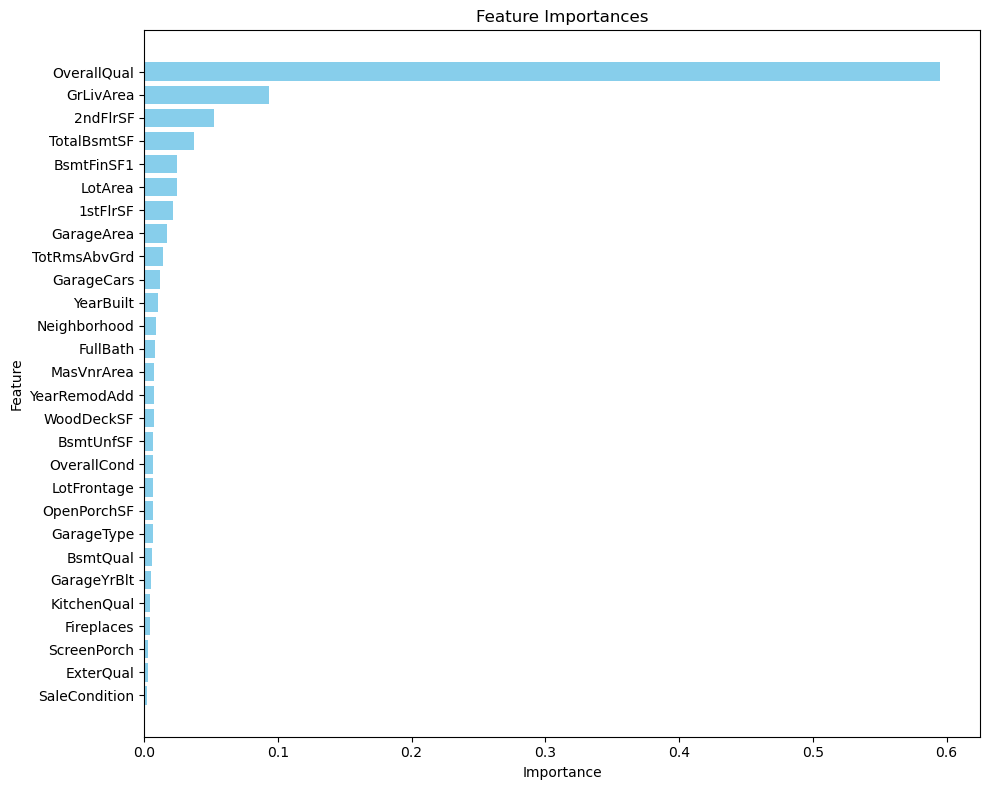

In [132]:
show_feature_importances(rf_model, 'label')

# Gradient Booster Regressor

In [133]:
gb_model = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('regressor', GradientBoostingRegressor())
])

In [134]:
grid_search_gb = GridSearchCV(
    estimator=gb_model,
    param_grid=param_grid_gb,
    cv=5,
    scoring=metric_to_optimize,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [135]:
grid_search_gb.fit(X_train, y_train)

gb_model = grid_search_gb.best_estimator_

y_pred_gb = gb_model.predict(X_test)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


In [136]:
print("Best hyperparameters:", grid_search_gb.best_params_)

results = show_results(y_test, y_pred_gb)
print(results)

report_ac['gb'] = results

Best hyperparameters: {'regressor__learning_rate': 0.05, 'regressor__max_depth': 5, 'regressor__n_estimators': 200}
{'mae': 17384.782443281612, 'mse': 706030345.2220633, 'rmse': 26571.231533785995, 'mape': 0.10182079647408405, 'r2': 0.8896306228144506}


In [137]:
pd.set_option('display.max_rows', None)

get_output_df(X_test, y_pred_gb, y_test).sort_values(by=['absolute_error'], ascending=False)

,GarageCars,Fireplaces,GarageArea,YearRemodAdd,BsmtUnfSF,LotArea,BsmtFinSF1,TotalBsmtSF,ScreenPorch,OverallQual,WoodDeckSF,MasVnrArea,OpenPorchSF,LotFrontage,GrLivArea,1stFlrSF,YearBuilt,OverallCond,FullBath,2ndFlrSF,TotRmsAbvGrd,GarageYrBlt,Neighborhood,BsmtQual,KitchenQual,SaleCondition,GarageType,ExterQual,pred,target,absolute_error
688,2,1,567,2007,474,8089,945,1419,0,8,140,0.0,0,60.0,1419,1419,2007,6,2,0,7,2007.0,StoneBr,Gd,Gd,Partial,Attchd,Gd,227167.694604,392000,164832.305396
898,3,2,820,2010,142,12919,2188,2330,0,9,0,760.0,67,100.0,2364,2364,2009,5,2,0,11,2009.0,NridgHt,Ex,Ex,Partial,Attchd,Ex,462725.050525,611657,148931.949475
1373,3,2,804,2002,1351,11400,1282,2633,0,10,314,705.0,140,NaN,2633,2633,2001,5,2,0,8,2001.0,NoRidge,Ex,Ex,Normal,Attchd,Ex,374483.531047,466500,92016.468953
218,2,2,431,2006,457,15660,341,798,0,7,0,312.0,119,NaN,1954,1137,1939,9,1,817,8,1939.0,Crawfor,TA,Gd,Normal,Attchd,Gd,228619.153905,311500,82880.846095
112,3,1,792,2007,280,9965,984,1264,168,7,120,220.0,184,77.0,2696,1282,2007,5,2,1414,10,2007.0,CollgCr,Ex,Ex,Partial,BuiltIn,Gd,304347.754380,383970,79622.245620
1142,3,1,1052,2007,316,9965,1150,1466,0,8,125,340.0,144,77.0,2828,1466,2006,5,3,1362,11,2006.0,CollgCr,Ex,Gd,Partial,BuiltIn,Gd,348464.137627,424870,76405.862373
678,3,1,834,2008,2046,11844,0,2046,0,8,322,464.0,82,80.0,2046,2046,2008,5,2,0,7,2008.0,StoneBr,Ex,Gd,Partial,Attchd,Gd,298872.174595,372500,73627.825405
1243,3,1,850,2006,690,13891,1386,2076,0,10,216,0.0,229,107.0,2076,2076,2006,5,2,0,7,2006.0,NridgHt,Ex,Ex,Partial,Attchd,Ex,391537.720384,465000,73462.279616
970,0,0,0,1950,720,10800,0,720,0,4,0,0.0,0,60.0,1192,720,1949,4,1,472,6,NaN,NAmes,TA,TA,Abnorml,NaN,TA,64335.302240,135000,70664.697760
1211,2,0,492,2005,132,12134,427,559,0,8,325,0.0,12,152.0,1752,1080,1988,7,2,672,8,1988.0,Gilbert,Gd,TA,Normal,Basment,Gd,227183.335165,164000,63183.335165


          Feature  Importance
9     OverallQual    0.575857
14      GrLivArea    0.096505
19       2ndFlrSF    0.056484
7     TotalBsmtSF    0.032405
6      BsmtFinSF1    0.028119
5         LotArea    0.025949
15       1stFlrSF    0.021063
20   TotRmsAbvGrd    0.020930
0      GarageCars    0.017009
27      ExterQual    0.013167
2      GarageArea    0.012129
16      YearBuilt    0.012032
23       BsmtQual    0.008613
17    OverallCond    0.007951
24    KitchenQual    0.006845
10     WoodDeckSF    0.006627
3    YearRemodAdd    0.006540
18       FullBath    0.006414
22   Neighborhood    0.006308
26     GarageType    0.006244
25  SaleCondition    0.005572
1      Fireplaces    0.004972
13    LotFrontage    0.004811
4       BsmtUnfSF    0.004487
12    OpenPorchSF    0.004040
8     ScreenPorch    0.003648
11     MasVnrArea    0.003282
21    GarageYrBlt    0.001997


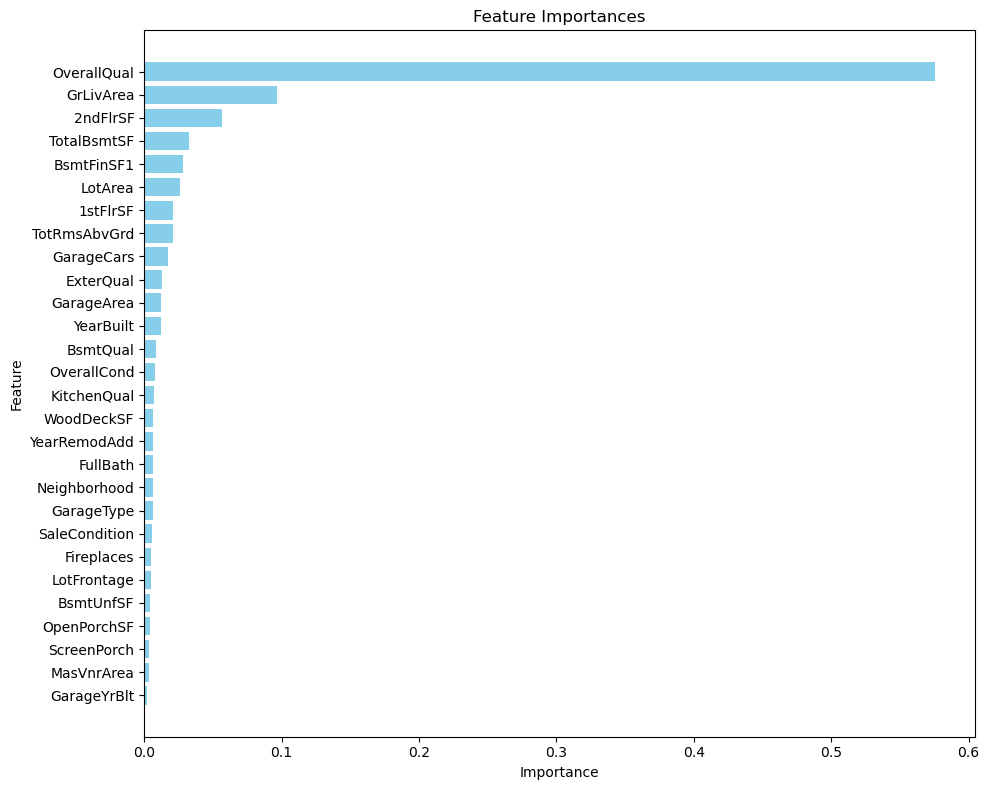

In [138]:
show_feature_importances(gb_model, 'label')

# Model Evaluation

In [139]:
report_ac

{'lr': {'mae': 22303.948525134034,
  'mse': 982812270.2548544,
  'rmse': 31349.836845745376,
  'mape': 0.13309244366350304,
  'r2': 0.8463630084848166},
 'ridge': {'mae': 22115.39432987761,
  'mse': 975923138.0692586,
  'rmse': 31239.768534181854,
  'mape': 0.1298929027825543,
  'r2': 0.8474399441063782},
 'lasso': {'mae': 22297.4005019561,
  'mse': 982617464.3698392,
  'rmse': 31346.729723686316,
  'mape': 0.1330574288336665,
  'r2': 0.8463934612894967},
 'elastic_net': {'mae': 22086.56850169166,
  'mse': 1002287175.475644,
  'rmse': 31658.919366833165,
  'mape': 0.1275690551834214,
  'r2': 0.8433186164491031},
 'svr': {'mae': 28887.54445240026,
  'mse': 2090080183.6693647,
  'rmse': 45717.39476030283,
  'mape': 0.15930723768924973,
  'r2': 0.6732706324869198},
 'knn': {'mae': 23490.264192324994,
  'mse': 1266667383.1883645,
  'rmse': 35590.27090636379,
  'mape': 0.13785288961758674,
  'r2': 0.8019896862368167},
 'mlp': {'mae': 45078.057645627625,
  'mse': 3348881025.8752785,
  'rmse'

# Testing against the real test set

In [140]:
df = pd.read_csv('test.csv')

In [141]:
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,TA,TA,PConc,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,470.0,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal
5,1466,60,RL,75.0,10000,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1993,1994,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,TA,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,763.0,763.0,GasA,Gd,Y,SBrkr,763,892,0,1655,0.0,0.0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1993.0,Fin,2.0,440.0,TA,TA,Y,157,84,0,0,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal
6,1467,20,RL,NaN,7980,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,1Story,6,7,1992,2007,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,TA,Gd,PConc,Gd,TA,No,ALQ,935.0,Unf,0.0,233.0,1168.0,GasA,Ex,Y,SBrkr,1187,0,0,1187,1.0,0.0,2,0,3,1,TA,6,Typ,0,NaN,Attchd,1992.0,Fin,2.0,420.0,TA,TA,Y,483,21,0,0,0,0,NaN,GdPrv,Shed,500,3,2010,WD,Normal
7,1468,60,RL,63.0,8402,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1998,1998,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,789.0,789.0,GasA,Gd,Y,SBrkr,789,676,0,1465,0.0,0.0,2,1,3,1,TA,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,393.0,TA,TA,Y,0,75,0,0,0,0,NaN,NaN,NaN,0,5,2010,WD,Normal
8,1469,20,RL,85.0,10176,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,1Story,7,5,1990,1990,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,TA,TA,PConc,Gd,TA,Gd,GLQ,637.0,Unf,0.0,663.0,1300.0,GasA,Gd,Y,SBrkr,1341,0,0,1341,1.0,0.0,1,1,2,1,Gd,5,Typ,1,Po,Attchd,1990.0,Unf,2.0,506.0,TA,TA,Y,192,0,0,0,0,0,NaN,NaN,NaN,0,2,2010,WD,Normal
9,1470,20,RL,70.0,8400,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,4,5,1970,1970,Gable,CompShg,Plywood

In [142]:
# instead of imputting for this variables I will use 0
df['MasVnrArea'] = df['MasVnrArea'].fillna(0)

In [143]:
df['MSSubClass'] = df['MSSubClass'].astype('category')
df=df.drop(['Id', 'PoolQC', 'MiscFeature', 'Alley'], axis=1)

In [144]:
numerical_features = ['LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold'
]

# I dropped Alley, PoolQC, MiscFeature
categorical_features = ['MSSubClass', 'MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'Fence',
       'SaleType', 'SaleCondition'
]

target = 'SalePrice'

In [145]:
df[categorical_features] = df[categorical_features].astype('category')

In [146]:
X = df[numerical_features + categorical_features].copy()

In [147]:
df_compare = X.copy()
df_compare['pred'] = gb_model.predict(X)
df_compare

,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSSubClass,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,Fence,SaleType,SaleCondition,pred
0,80.0,11622,5,6,1961,1961,0.0,468.0,144.0,270.0,882.0,896,0,0,896,0.0,0.0,1,0,2,1,5,0,1961.0,1.0,730.0,140,0,0,0,120,0,0,6,2010,20,RH,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,NaN,TA,TA,CBlock,TA,TA,No,Rec,LwQ,GasA,TA,Y,SBrkr,TA,Typ,NaN,Attchd,Unf,TA,TA,Y,MnPrv,WD,Normal,129478.065305
1,81.0,14267,6,6,1958,1958,108.0,923.0,0.0,406.0,1329.0,1329,0,0,1329,0.0,0.0,1,1,3,1,6,0,1958.0,1.0,312.0,393,36,0,0,0,0,12500,6,2010,20,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,TA,TA,CBlock,TA,TA,No,ALQ,Unf,GasA,TA,Y,SBrkr,Gd,Typ,NaN,Attchd,Unf,TA,TA,Y,NaN,WD,Normal,162021.865787
2,74.0,13830,5,5,1997,1998,0.0,791.0,0.0,137.0,928.0,928,701,0,1629,0.0,0.0,2,1,3,1,6,1,1997.0,2.0,482.0,212,34,0,0,0,0,0,3,2010,60,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,NaN,TA,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Gd,Y,SBrkr,TA,Typ,TA,Attchd,Fin,TA,TA,Y,MnPrv,WD,Normal,182826.464512
3,78.0,9978,6,6,1998,1998,20.0,602.0,0.0,324.0,926.0,926,678,0,1604,0.0,0.0,2,1,3,1,7,1,1998.0,2.0,470.0,360,36,0,0,0,0,0,6,2010,60,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,TA,TA,PConc,TA,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Gd,Attchd,Fin,TA,TA,Y,NaN,WD,Normal,190747.841898
4,43.0,5005,8,5,1992,1992,0.0,263.0,0.0,1017.0,1280.0,1280,0,0,1280,0.0,0.0,2,0,2,1,5,0,1992.0,2.0,506.0,0,82,0,0,144,0,0,1,2010,120,RL,Pave,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,Gable,CompShg,HdBoard,HdBoard,NaN,Gd,TA,PConc,Gd,TA,No,ALQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NaN,Attchd,RFn,TA,TA,Y,NaN,WD,Normal,203300.840874
5,75.0,10000,6,5,1993,1994,0.0,0.0,0.0,763.0,763.0,763,892,0,1655,0.0,0.0,2,1,3,1,7,1,1993.0,2.0,440.0,157,84,0,0,0,0,0,4,2010,60,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Gilbert,Norm,Norm,1Fam,2Story,Gable,CompShg,HdBoard,HdBoard,NaN,TA,TA,PConc,Gd,TA,No,Unf,Unf,GasA,Gd,Y,SBrkr,TA,Typ,TA,Attchd,Fin,TA,TA,Y,NaN,WD,Normal,178378.792084
6,NaN,7980,6,7,1992,2007,0.0,935.0,0.0,233.0,1168.0,1187,0,0,1187,1.0,0.0,2,0,3,1,6,0,1992.0,2.0,420.0,483,21,0,0,0,0,500,3,2010,20,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,1Story,Gable,CompShg,HdBoard,HdBoard,NaN,TA,Gd,PConc,Gd,TA,No,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,NaN,Attchd,Fin,TA,TA,Y,GdPrv,WD,Normal,175368.500951
7,63.0,8402,6,5,1998,1998,0.0,0.0,0.0,789.0,789.0,789,676,0,1465,0.0,0.0,2,1,3,1,7,1,1998.0,2.0,393.0,0,75,0,0,0,0,0,5,2010,60,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,NaN,TA,TA,PConc,Gd,TA,No,Unf,Unf,GasA,Gd,Y,SBrkr,TA,Typ,Gd,Attchd,Fin,TA,TA,Y,NaN,WD,Normal,164332.812074
8,85.0,10176,7,5,1990,1990,0.0,637.0,0.0,663.0,1300.0,1341,0,0,1341,1.0,0.0,1,1,2,1,5,1,1990.0,2.0,506.0,192,0,0,0,0,0,0,2,2010,20,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,1Story,Gable,CompShg,HdBoard,HdBoard,NaN,TA,TA,PConc,Gd,TA,Gd,GLQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Po,Attchd,Unf,TA,TA,Y,NaN,WD,Normal,173946.368193
9,70.0,8400,4,5,1970,1970,0.0,804.0,78.0,0.0,882.0,882,0,0,882,1.0,0.0,1,0,2,1,4,0,1970.0,2.0,525.0,240,0,0,0,0,0,0,4,2010,20,RL,Pave,Reg,Lvl,AllPub,Corner,Gtl,NAmes,Norm,No

# Notes

For this result I used only the union of the top 25 features from RF and GB.

The results were basically the same with a small improvement for the GB model: 

    - Random Forest Regressor with R2=0.869, MAE=19309.38 and RMSE=28924.19

    - Gradient Boost Regressor with R2=0.889, MAE=17359.07 and RMSE=26624.73

Additional approaches would follow more feature engineering:

1 - Fill Na values with values that make sense for each feature

2 - For Ordinal Categorical variables like quality etc, map them to numbers and with the correct order and transform the feature in a numerical one. Or even better define the mapping in a ordinal encoder

3 - Do the same for the neighborhood, sort the mean values of SalePrice per neigborhood and then use the order as the mapping

4 - Add a age variable to the house -> yearsold-yearbuild (think about the remodelations)

5 - Add the area of the entire house (floors+basement+garage)

6 - Manually remove outliers through the scatter plots with respect to the target variable and remove values that are way off

In [ ]:
 'rf': {'mae': 19309.376879451327,
  'mse': 836608505.1942228,
  'rmse': 28924.185471577635,
  'mape': 0.11384981779261533,
  'r2': 0.8692181429717756},
 'gb': {'mae': 17359.07466384123,
  'mse': 708876464.4767475,
  'rmse': 26624.734073352687,
  'mape': 0.10156496831064275,
  'r2': 0.889185706513528}}